<img src="https://www.unir.net/wp-content/uploads/2019/11/Unir_2021_logo.svg" width="240" height="240" align="right"/>

<span>
<h2>Eliminación de ruido en imagenes de resonancia magnetica, mediante red neuronal convolucional CNN </h2> 
</span>

## DIPY 

#### https://dipy.org/documentation/1.0.0./examples_built/brain_extraction_dwi/

In [1]:
import numpy as np
import nibabel as nib

In [1]:
from nipype.interfaces import brainsuite
from nipype.testing import example_data
bse = brainsuite.Bse()
path_img = r"D:\output\I45108\ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii"

bse.inputs.inputMRIFile = example_data(path_img)

In [2]:
results = bse.run() 

OSError: No command "bse" found on host DESKTOP-63P1P4I. Please check that the corresponding package is installed.

In [ ]:
results

In [93]:
# from dipy.data.fetcher import fetch_scil_b0, read_siemens_scil_b0
# fetch_scil_b0()
# img = read_siemens_scil_b0()
# data = np.squeeze(img.get_data())
# print(type(data.shape), data.shape)

<class 'tuple'> (128, 128, 65)


C:\Users\Juan David\AppData\Local\Temp\ipykernel_2788\1122746890.py:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  data = np.squeeze(img.get_data())


In [123]:
path_img = r"D:\output\I45108\ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii"

img = nib.load(path_img)
data = np.squeeze(img.get_data())

print(img.shape, type(data.shape), data.shape)

(256, 256, 166) <class 'tuple'> (256, 256, 166)


C:\Users\Juan David\AppData\Local\Temp\ipykernel_2788\2079959438.py:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  data = np.squeeze(img.get_data())


In [89]:
from dipy.segment.mask import median_otsu
b0_mask, mask = median_otsu(data, median_radius=2, numpass=1)

In [124]:
b0_mask_crop, mask_crop = median_otsu(data, median_radius=4, numpass=4,
                                      autocrop=True)

In [99]:
mask_img = nib.Nifti1Image(mask.astype(np.float32), img.affine)
b0_img = nib.Nifti1Image(b0_mask.astype(np.float32), img.affine)

fname = 'se_1.5t'
nib.save(mask_img, fname + '_binary_mask.nii.gz')
nib.save(b0_img, fname + '_mask.nii.gz')

In [100]:
data.shape

(256, 256, 166)

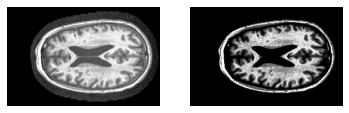

In [125]:
import matplotlib.pyplot as plt
from dipy.core.histeq import histeq

sli = data.shape[2] // 2
plt.figure('Brain segmentation')
plt.subplot(1, 2, 1).set_axis_off()
plt.imshow(histeq(data[sli,:, :].astype('float')).T,
           cmap='gray', origin='lower')

plt.subplot(1, 2, 2).set_axis_off()
plt.imshow(histeq(b0_mask[sli,:, :].astype('float')).T,
           cmap='gray', origin='lower')

plt.savefig('median_otsu.png')

100 166 (256, 256, 166)


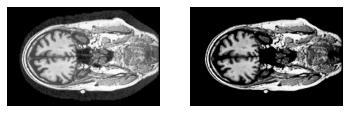

In [142]:
import matplotlib.pyplot as plt
from dipy.core.histeq import histeq

sli = data.shape[0] // 2
sli = 100
print(sli,data.shape[2],data.shape)

plt.figure('Brain segmentation')
plt.subplot(1, 2, 1).set_axis_off()
plt.imshow(histeq(data[:, sli, :].astype('float')).T,
           cmap='gray', origin='lower')

plt.subplot(1, 2, 2).set_axis_off()
plt.imshow(histeq(b0_mask[:, sli, :].astype('float')).T,
           cmap='gray', origin='lower')

plt.savefig('median_otsu.png')

(256, 256, 166)


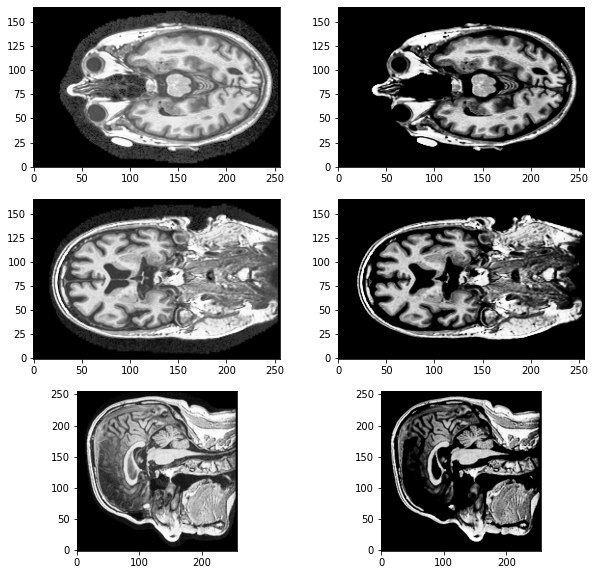

In [127]:
import matplotlib.pyplot as plt
from dipy.core.histeq import histeq

print(data.shape)


center_i = (n_i - 1) // 2  # // division entera Coronal
center_j = (n_j - 1) // 2 # // division entera Axial
center_k = (n_k - 1) // 2 # // division entera Sagital

slice_coronal_0 = data[center_i, :, :] # Coronal
slice_axial_1 = data[:, center_j, :] # Axial
slice_sagital_2 = data[:, :, center_k] # Sagital

fig = plt.figure(figsize=(10,10))

plt.subplot(3, 2, 1)
plt.imshow(histeq(data[center_i, :, :].astype('float')).T,
           cmap='gray', origin='lower')

plt.subplot(3, 2, 2)
plt.imshow(histeq(b0_mask[center_i, :, :].astype('float')).T,
           cmap='gray', origin='lower')
  
plt.subplot(3, 2, 3)
plt.imshow(histeq(data[:, center_j, :].astype('float')).T,
           cmap='gray', origin='lower')

plt.subplot(3, 2, 4)
plt.imshow(histeq(b0_mask[:, center_j, :].astype('float')).T,
           cmap='gray', origin='lower')    

plt.subplot(3, 2, 5)
plt.imshow(histeq(data[:, :, center_k].astype('float')).T,
           cmap='gray', origin='lower')

plt.subplot(3, 2, 6)
plt.imshow(histeq(b0_mask[:, :, center_k].astype('float')).T,
           cmap='gray', origin='lower') 

# plt.savefig('median_otsu.png')

127
127
82


((256, 166), (256, 166), (256, 256))

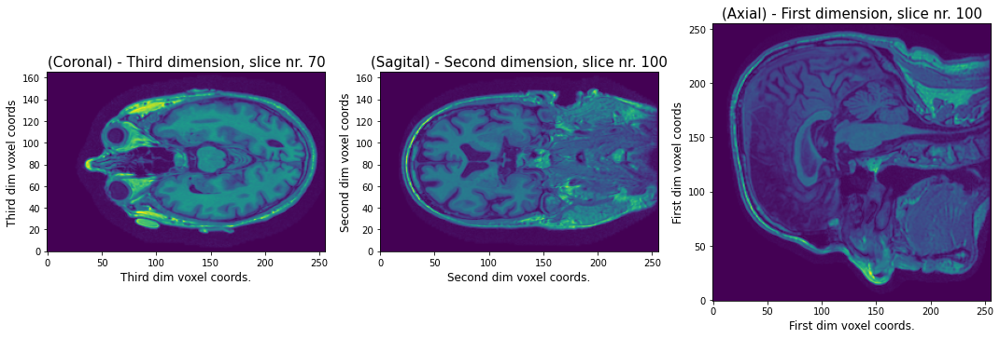

In [102]:
import matplotlib.pyplot as plt
from dipy.core.histeq import histeq


fig, ax = plt.subplots(ncols=3, figsize=(15, 5))

# 2. Obtener los valores de las 3D del la imagen .nii
n_i, n_j, n_k = data.shape

# 3. Obtener el ejecentral de cada dimension
center_i = (n_i - 1) // 2  # // division entera
center_j = (n_j - 1) // 2
center_k = (n_k - 1) // 2

print(center_i)
print(center_j)
print(center_k)

# 4. Obtener cortes de cada dimension ubicados en el centro de cada dimension
slice_coronal_0 = data[center_i, :, :] # Coronal
slice_axial_1 = data[:, center_j, :] # Axial
slice_sagital_2 = data[:, :, center_k] # Sagital
                 

ax[0].imshow(slice_coronal_0.T, origin='lower')
#ax[0].imshow(histeq(slice_coronal_0.astype('float')).T, cmap='gray', origin='lower')
ax[0].set_xlabel('Third dim voxel coords.', fontsize=12)
ax[0].set_ylabel('Third dim voxel coords', fontsize=12)
ax[0].set_title('(Coronal) - Third dimension, slice nr. 70', fontsize=15)


ax[1].imshow(slice_axial_1.T, origin='lower')
#ax[1].imshow(histeq(slice_axial_1.astype('float')).T, cmap='gray', origin='lower')
ax[1].set_xlabel('Second dim voxel coords.', fontsize=12)
ax[1].set_ylabel('Second dim voxel coords', fontsize=12)
ax[1].set_title('(Sagital) - Second dimension, slice nr. 100', fontsize=15)

ax[2].imshow(slice_sagital_2.T, origin='lower')
#ax[2].imshow(histeq(slice_sagital_2.astype('float')).T, cmap='gray', origin='lower')
ax[2].set_xlabel('First dim voxel coords.', fontsize=12)
ax[2].set_ylabel('First dim voxel coords', fontsize=12)
ax[2].set_title('(Axial) - First dimension, slice nr. 100', fontsize=15)

fig.tight_layout()

slice_coronal_0.shape, slice_axial_1.shape, slice_sagital_2.shape




In [16]:
%run prepocesamiento_helper.ipynb

ModuleNotFoundError: No module named 'nbformat'

In [15]:
normalize_image(data, 0)

NameError: name 'normalize_image' is not defined

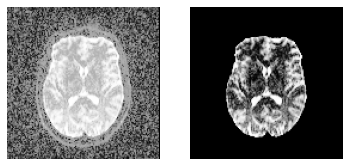

In [25]:
# import matplotlib.pyplot as plt
# from dipy.core.histeq import histeq

# sli = data.shape[2] // 2
# plt.figure('Brain segmentation')
# plt.subplot(1, 2, 1).set_axis_off()
# plt.imshow(histeq(data[:, :, sli].astype('float')).T,
#            cmap='gray', origin='lower')

# plt.subplot(1, 2, 2).set_axis_off()
# plt.imshow(histeq(b0_mask[:, :, sli].astype('float')).T,
#            cmap='gray', origin='lower')

# plt.savefig('median_otsu.png')

In [18]:
b0_mask_crop, mask_crop = median_otsu(data, median_radius=4, numpass=4,
                                      autocrop=True)

In [19]:
mask_img_crop = nib.Nifti1Image(mask_crop.astype(np.float32), img.affine)

b0_img_crop = nib.Nifti1Image(b0_mask_crop.astype(np.float32), img.affine)
                              nib.save(mask_img_crop, fname + '_binary_mask_crop.nii.gz')
                              nib.save(b0_img_crop, fname + '_mask_crop.nii.gz')

## EJEMPLO 2

In [146]:
!pip install nilearn

In [5]:
# Image settings
from nilearn import plotting
import pylab as plt

import numpy as np
from nilearn import image as nli

In [7]:
path_img = r"D:\output\I45108\ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070319113623975_S13408_I45108.nii"

t1 = nli.load_img(path_img)

t1.shape


(256, 256, 166)

In [9]:
img = nli.mean_img(t1)


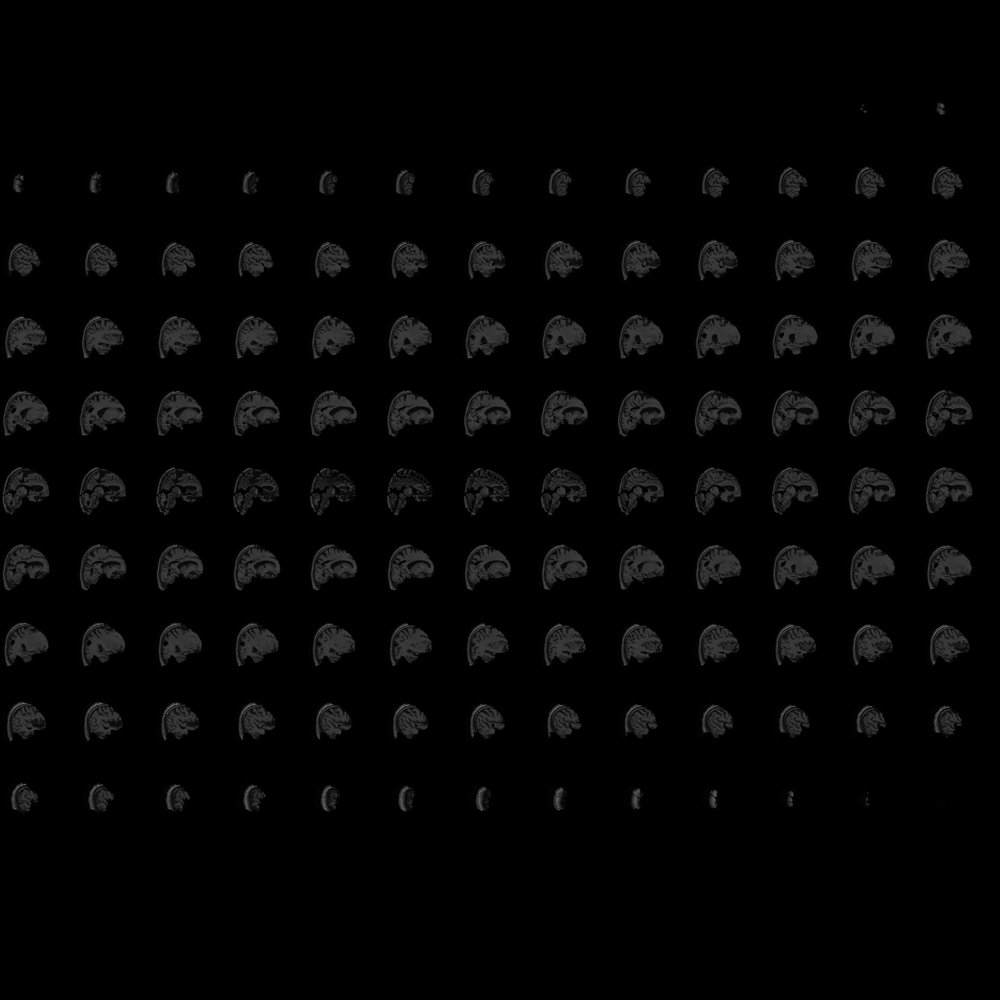
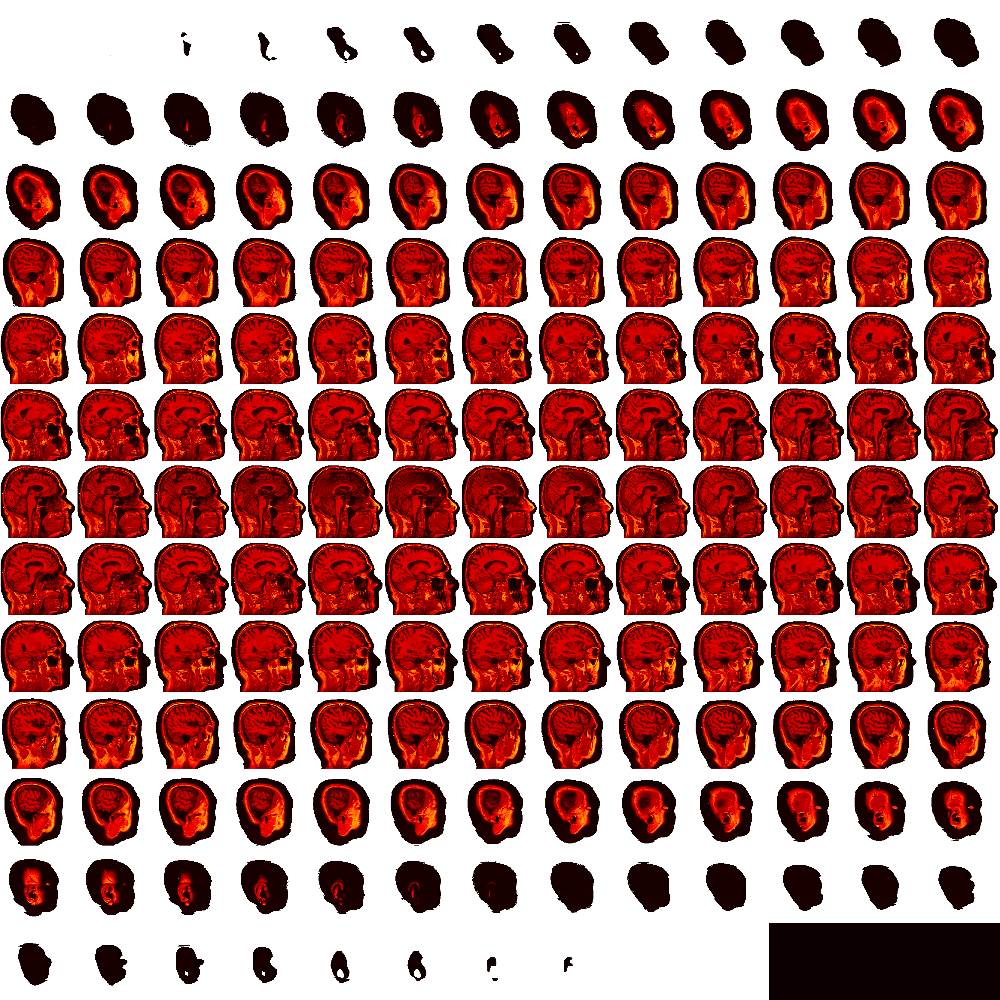

In [10]:
plotting.view_img(img, bg_img=img)

In [11]:
mean = nli.mean_img(t1)

In [12]:
thr = nli.threshold_img(mean, threshold='95%')


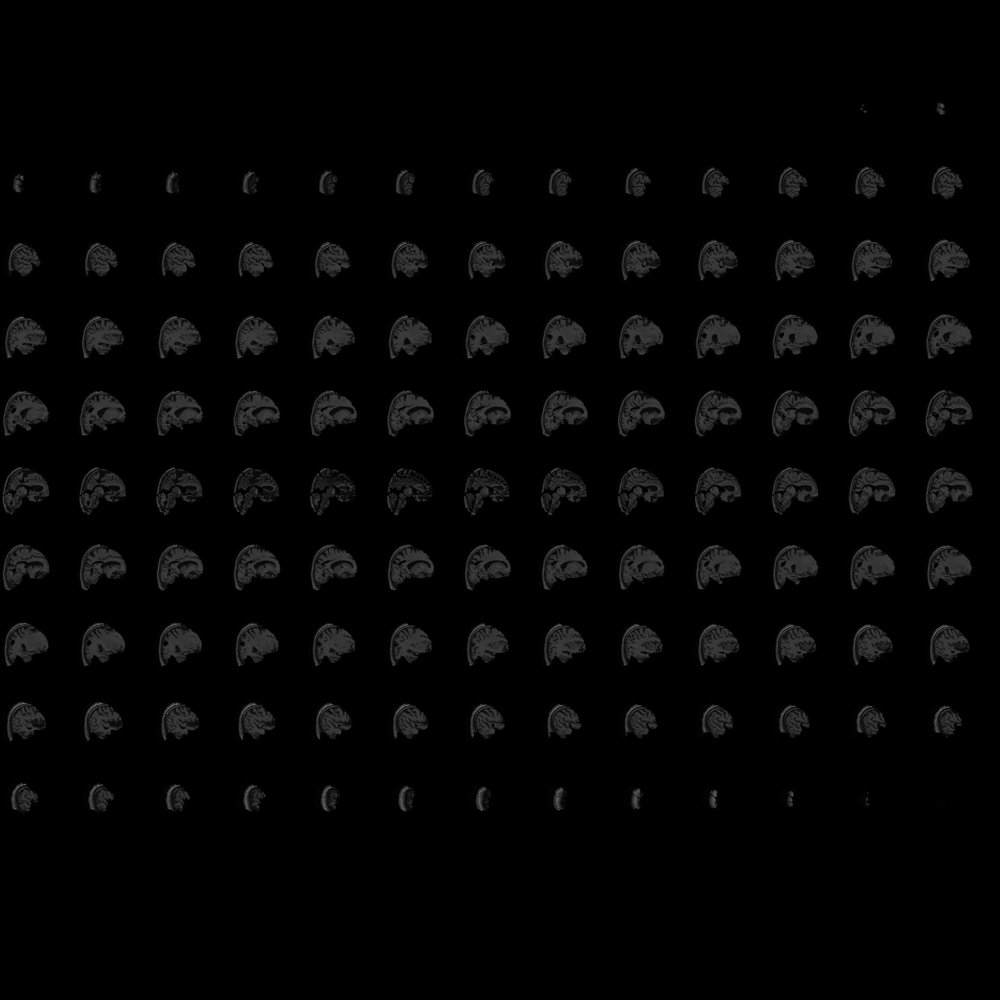
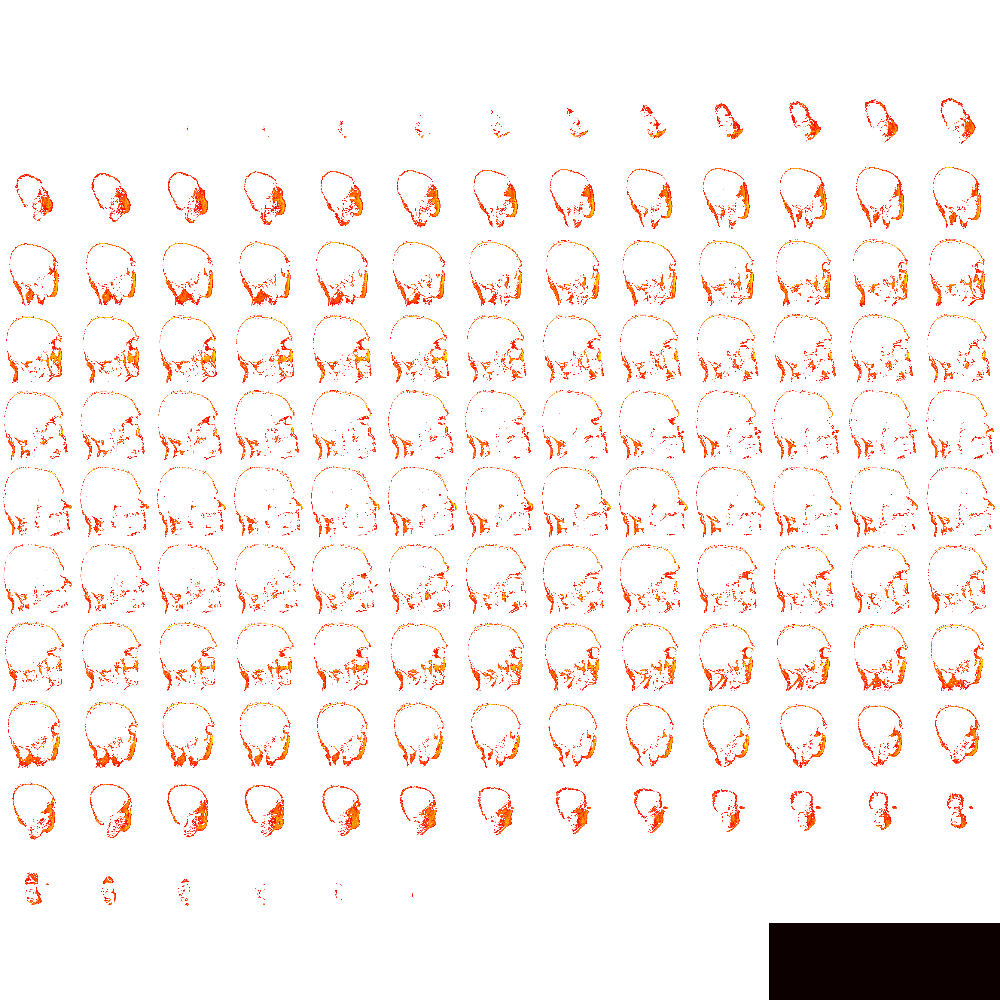

In [13]:
plotting.view_img(thr, bg_img=img)

In [14]:
voxel_size = np.prod(thr.header['pixdim'][1:4])  # Size of 1 voxel in mm^3
voxel_size

1.0756564

In [15]:
from nilearn.regions import connected_regions
cluster = connected_regions(thr, min_region_size=1000. / voxel_size, smoothing_fwhm=1)[0]

In [16]:
mask = nli.math_img('np.mean(img,axis=3) > 0', img=cluster)

C:\ProgramData\Anaconda3\envs\segmentacion_craneo\lib\site-packages\numpy\ma\core.py:2826: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


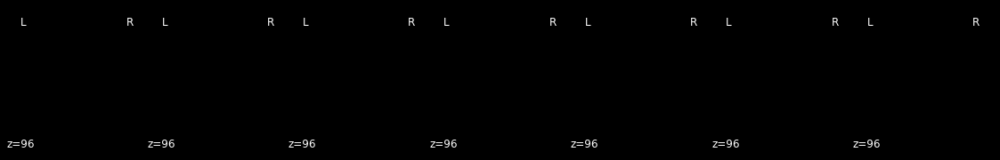

In [17]:
from nilearn.plotting import plot_roi
plotting.plot_roi(mask, bg_img=t1, display_mode='z', dim=-.5, cmap='magma_r');

In [19]:
# Apply mask to original functional image
from nilearn.masking import apply_mask

all_timecourses = apply_mask(img, mask)
all_timecourses.shape

(514935,)

In [20]:
from nilearn.masking import unmask
img_timecourse = unmask(all_timecourses, mask)

In [21]:
mean_timecourse = all_timecourses.mean(axis=1)
plt.plot(mean_timecourse)

AxisError: axis 1 is out of bounds for array of dimension 1